# Step-1 : Load Libraries, Read Reference and Scanned Images

In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

In [2]:
# Saving image path to an variable
img_path_1 = 'Homography/refDatabricks.jpg'

img_path_2 = 'Homography/databricks.jpg'

# Load BGR (OpenCV default)
im1 = cv.imread(img_path_1)
im1 = cv.cvtColor(im1, cv.COLOR_BGR2RGB)
im2 = cv.imread(img_path_2)
im2 = cv.cvtColor(im2, cv.COLOR_BGR2RGB)

assert im1 is not None, f"Image at {img_path_1} could not be read."
assert im2 is not None, f"Image at {img_path_2} could not be read."

Text(0.5, 1.0, 'Scanned')

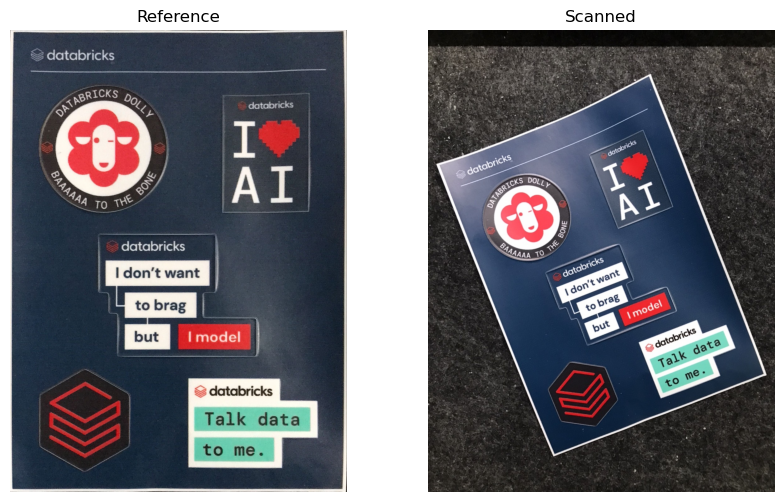

In [3]:
plt.figure(figsize=[10,6]);
plt.subplot(121); plt.axis('off'); plt.imshow(im1); plt.title("Reference")
plt.subplot(122); plt.axis('off'); plt.imshow(im2); plt.title("Scanned")

# Step 2: Find keypoints in both Images

In [4]:
import time
# Convert images to grayscale
im1_gray = cv.cvtColor(im1, cv.COLOR_BGR2GRAY)
im2_gray = cv.cvtColor(im2, cv.COLOR_BGR2GRAY)

# Initiate SIFT detector
sift = cv.SIFT_create()

# Find keypoints and descriptors with SIFT

keypoints1, descriptors1 = sift.detectAndCompute(im1_gray,None)
keypoints2, descriptors2 = sift.detectAndCompute(im2_gray,None)

idx = 1
print ("keypoint angle: ", keypoints1[idx].angle)
print ("keypoint size:  ", keypoints1[idx].size)
print ("keypoint x:     ", keypoints1[idx].pt[0])
print ("keypoint y:     ", keypoints1[idx].pt[1])
print ("")
print ("descriptor: ", descriptors1[idx])
print ("")

keypoint angle:  0.4341888427734375
keypoint size:   3.24059796333313
keypoint x:      3.844083547592163
keypoint y:      26.785608291625977

descriptor:  [ 17.   0.   0.   0.   0.   0.   0.   4. 211.   4.   0.   0.   0.   0.
   0.  32. 135.   7.   2.  18.   7.   0.   0.   3.   0.   0.   4.  28.
  25.   2.   0.   0.  20.   0.   0.   0.   0.   0.   0.   2. 211.   3.
   0.   0.   0.   0.   0.  34. 153.   3.   1.   5.  19.   6.   1.  10.
   0.   0.   1.   5.  25.  19.  10.   3.  20.   0.   0.   0.   0.   0.
   0.   1. 211.   8.   0.   0.   0.   0.   0.  11. 144.   7.   1.   2.
  12.   5.   1.   4.   1.   1.   2.   6.  23.   5.   3.   4.  14.   1.
   0.   0.   0.   0.   0.   1. 211.  34.   0.   0.   0.   0.   0.  10.
 108.  22.   2.   2.   2.   0.   1.   4.   0.   0.   1.   4.  19.   4.
   3.   0.]



Text(0.5, 1.0, 'Scanned')

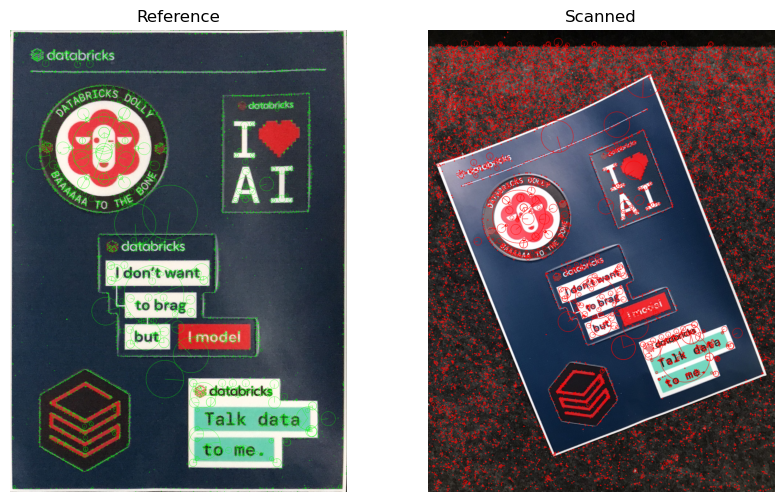

In [5]:
# Display
im1_display = cv.drawKeypoints(im1, keypoints1, outImage=np.array([]), color=(0, 255, 0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
im2_display = cv.drawKeypoints(im2, keypoints2, outImage=np.array([]), color=(255, 0, 0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=[10,6]);
plt.subplot(121); plt.axis('off'); plt.imshow(im1_display); plt.title("Reference")
plt.subplot(122); plt.axis('off'); plt.imshow(im2_display); plt.title("Scanned")

# Step 3 : Match keypoints in the two image

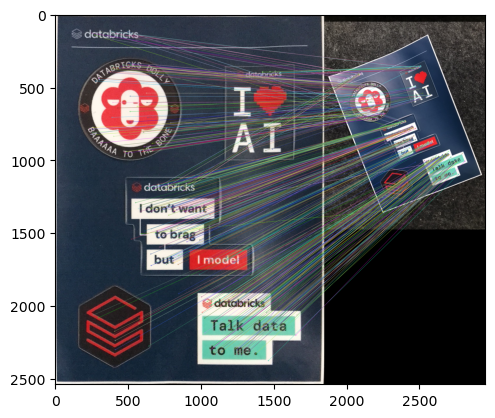

In [6]:
# BFMatcher with default params
bf = cv.BFMatcher()
matches = bf.knnMatch(descriptors1,descriptors2,k=2)
# Apply ratio test - D-Lowe!
good = []
for m,n in matches:
  if m.distance < 0.50*n.distance:
    good.append([m])
# cv.drawMatchesKnn expects list of lists as matches.
img3 = cv.drawMatchesKnn(im1,keypoints1,im2,keypoints2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3)

In [7]:
len(matches), len(good)

(6172, 508)

In [8]:
matches[0][1]

< cv2.DMatch 0x127023510>

In [9]:
matches[0][0].distance

146.16429138183594

In [10]:
good[0]

[< cv2.DMatch 0x128474870>]

In [11]:
print(descriptors1[good[0][0].queryIdx])
print(descriptors2[good[0][0].trainIdx])

[ 30.   2.   0.   0.   0.   0.   0.   9. 135.   1.   0.   1.   0.   1.
   1.  36.  63.   2.  12.  34.  24.  71.  13.  15.   2.  10.  31.  11.
   7.  45.  76.  23.  52.   5.   0.   0.   0.   0.   0.  11. 135.   5.
   1.   6.   9.   0.   0.  25.  57.   4.  32. 135. 109.   7.   0.   3.
   8.  59. 126.  49.  16.   5.   5.   5.  53.  13.   0.   0.   0.   0.
   0.   0. 135.  25.   2.   1.  11.   6.   0.   9.  41.   7.   9.  17.
 127. 121.  28.   4.  10.   9.  10.   8.  18.  45. 121.  47.  18.  12.
   1.   0.   1.   1.   2.   1.  84. 121.  53.   0.   1.   1.   0.   0.
   9.  49. 135.   5.   5.  27.  12.   0.   0.   4. 135.  14.   0.   9.
  45.  10.]
[ 27.   3.   2.   0.   0.   0.   0.   4. 135.   1.   0.   1.   1.   2.
   1.  29.  57.   2.   6.  22.  41.  89.  18.  13.   5.   8.  15.   7.
  10.  42.  85.  39.  49.   3.   1.   0.   0.   0.   1.   7. 135.   4.
   2.   6.   6.   0.   0.  20.  59.   6.  42. 135.  83.   9.   2.   3.
   8.  67. 134.  41.  12.   5.  10.   7.  55.  15.   3.   1.   0.

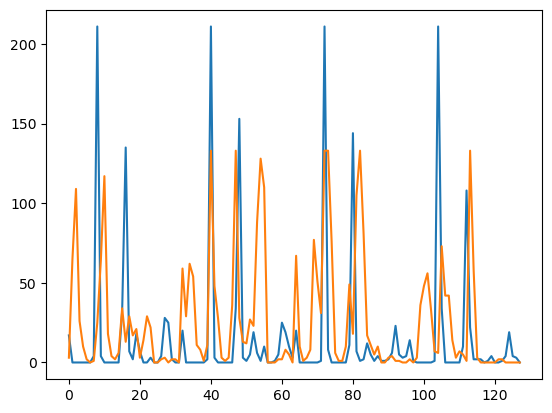

In [12]:
d1 = descriptors1[1]
d2 = descriptors2[1]
plt.plot(d1)
plt.plot(d2)

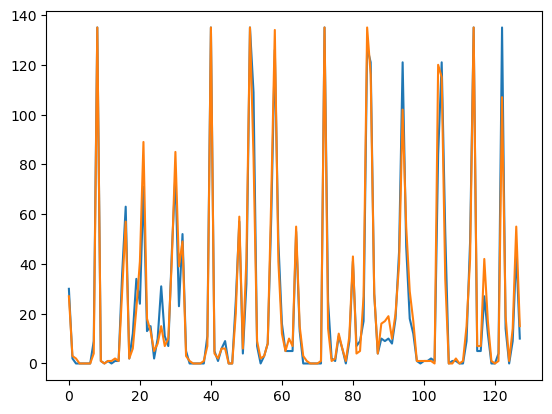

In [13]:
idx = 0
d1 = descriptors1[good[idx][0].queryIdx]
d2 = descriptors2[good[idx][0].trainIdx]
plt.plot(d1)
plt.plot(d2)

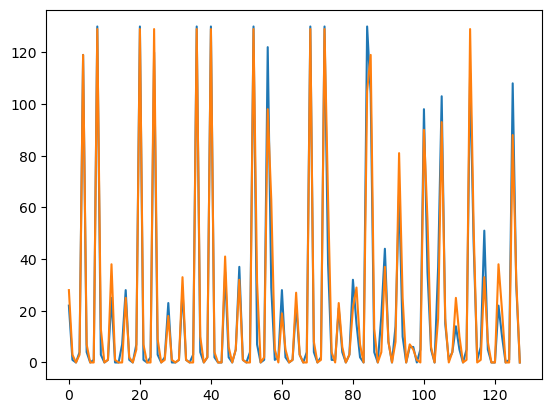

In [14]:
idx = 30
d1 = descriptors1[good[idx][0].queryIdx]
d2 = descriptors2[good[idx][0].trainIdx]
plt.plot(d1)
plt.plot(d2)

(-0.5, 2953.5, 2537.5, -0.5)

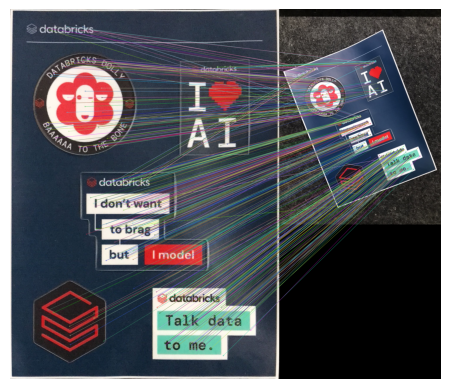

In [15]:
plt.imshow(img3)
plt.axis('off')

# Step 4:  Find Homography

In [16]:
# Extract location of good matches
points1 = np.zeros((len(good), 2), dtype=np.float32)
points2 = np.zeros((len(good), 2), dtype=np.float32)

for i, match in enumerate(good):
  points1[i, :] = keypoints1[match[0].queryIdx].pt
  points2[i, :] = keypoints2[match[0].trainIdx].pt

# Find homography
h, mask = cv.findHomography(points2, points1, cv.RANSAC)

idx = 10
print("Homography")
print(h)
print("")
print("Point-1 (Reference)")
print(points1[idx, :])
print("")
print("Point-2 (scan)")
print(points2[idx, :])
print("")

print("Express point-2 (scan) in homogeneous coordinates")
p2_homo = np.append(points2[idx, :],1)
print(p2_homo)
print("")

p1_homo = np.matmul(h,p2_homo.T)
print("p1_homo = H * p2_homo")
print(p1_homo)
print("")
print("Normalized p1_homo (Reference)")
print (p1_homo/p1_homo[2])

Homography
[[ 2.36783998e+00 -9.12473187e-01  3.19055101e+02]
 [ 8.96504146e-01  2.44772441e+00 -1.08971338e+03]
 [-1.41953261e-05  3.23897216e-05  1.00000000e+00]]

Point-1 (Reference)
[278.10175 459.1334 ]

Point-2 (scan)
[201.40118 562.96124]

Express point-2 (scan) in homogeneous coordinates
[201.40118408 562.96124268   1.        ]

p1_homo = H * p2_homo
[282.253837   468.81759171   1.0153752 ]

Normalized p1_homo (Reference)
[277.97984068 461.71857514   1.        ]


 # Step 5: Warp image

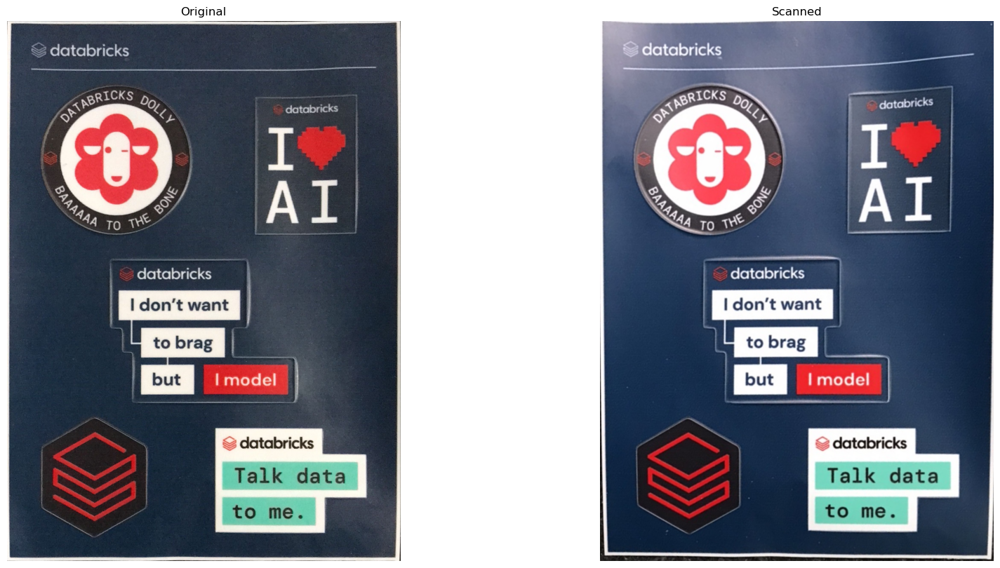

In [17]:
# Use homography to warp image
height, width, channels = im1.shape
im2_warped = cv.warpPerspective(im2, h, (width, height))
# Display results
plt.figure(figsize=[20,10]);
plt.subplot(121); plt.imshow(im1); plt.axis('off'); plt.title("Original");
plt.subplot(122); plt.imshow(im2_warped); plt.axis('off'); plt.title("Scanned");

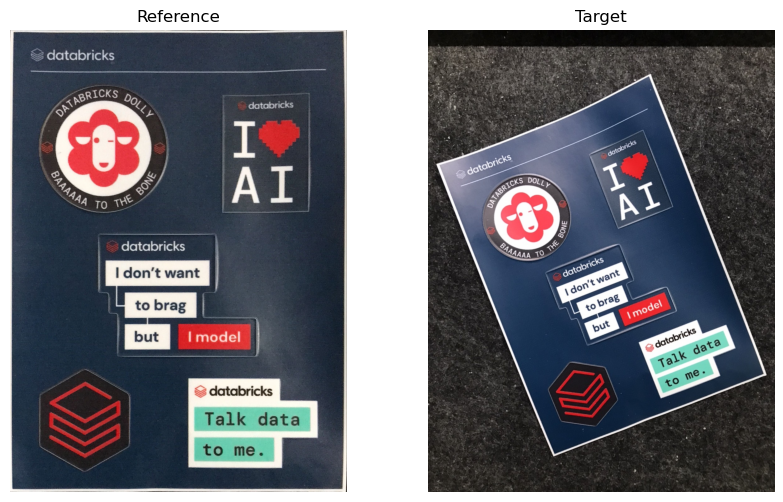

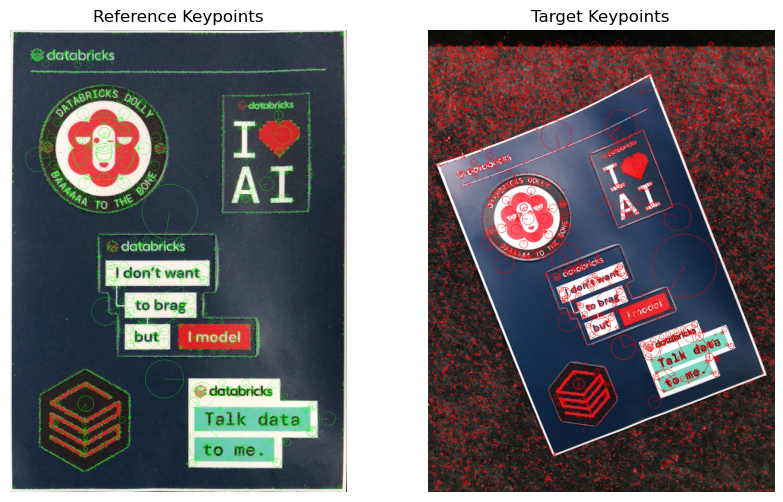

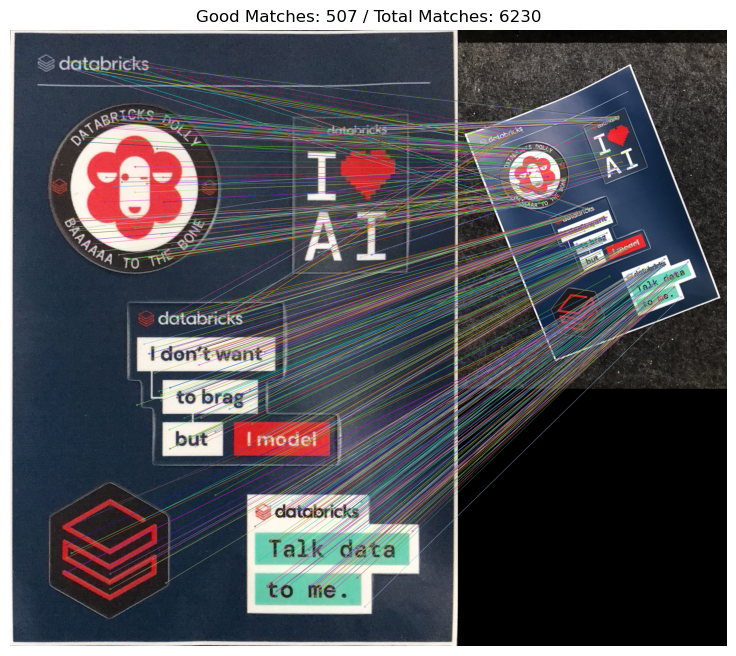

Keypoint in Reference Image:
  x, y: (228.32388305664062, 2236.783447265625)
  size: 16.62125015258789
  angle: 110.45856475830078
Descriptor vector (128-d): [ 21.   0.   0.  39. 141.   0.   0.   7. 141.   0.   0.   4.  32.   1.
   0.  72.  75.   0.   0.  33. 141.   1.   0.  27.   1.   0.   0.  11.
  92.   6.   2.   1.  28.   1.   0.  40. 141.   0.   0.   5. 141.  23.
   5.  15.  28.   0.   0.  42.  60.   7.   5. 112. 141.   0.   0.   9.
   3.   2.   1.  27.  75.   1.   0.   1.  12.   6.   1.  53. 141.   0.
   0.   1.  95. 111.  60.  27.  11.   0.   0.   1.  10.  23.  65. 141.
  66.   0.   0.   0.   3.   0.   1.  15.  25.   4.   1.   8.   0.   1.
   7.  65.  30.   0.   1.   1.   0.  11.  17.   4.   3.   1.  12.   7.
   0.   2.  16.  16.   1.   1.  36.  15.   1.   0.   1.   2.   0.   0.
  36.  44.]

Keypoint in Target Image:
  x, y: (441.1144104003906, 1224.57763671875)
  size: 6.841651439666748
  angle: 91.84828186035156
Descriptor vector (128-d): [ 32.   0.   0.  30. 150.   0.   0.   

In [18]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# 1️⃣ Load Images
# -----------------------------
ref_image_path = 'Homography/refDatabricks.jpg'
target_image_path = 'Homography/databricks.jpg'

ref_img = cv.imread(ref_image_path)
target_img = cv.imread(target_image_path)

# Check images
assert ref_img is not None, f"Image at {ref_image_path} not found"
assert target_img is not None, f"Image at {target_image_path} not found"

# Convert BGR to RGB for Matplotlib display
ref_img_rgb = cv.cvtColor(ref_img, cv.COLOR_BGR2RGB)
target_img_rgb = cv.cvtColor(target_img, cv.COLOR_BGR2RGB)

# Display original images
plt.figure(figsize=[10,6])
plt.subplot(121); plt.imshow(ref_img_rgb); plt.axis('off'); plt.title("Reference")
plt.subplot(122); plt.imshow(target_img_rgb); plt.axis('off'); plt.title("Target")
plt.show()

# -----------------------------
# 2️⃣ Convert to Grayscale
# -----------------------------
ref_gray = cv.cvtColor(ref_img, cv.COLOR_BGR2GRAY)
target_gray = cv.cvtColor(target_img, cv.COLOR_BGR2GRAY)

# -----------------------------
# 3️⃣ Initialize SIFT and Detect Keypoints
# -----------------------------
sift = cv.SIFT_create()
kp_ref, des_ref = sift.detectAndCompute(ref_gray, None)
kp_target, des_target = sift.detectAndCompute(target_gray, None)

# -----------------------------
# 4️⃣ Visualize Keypoints
# -----------------------------
ref_kp_img = cv.drawKeypoints(ref_img_rgb, kp_ref, outImage=np.array([]), color=(0,255,0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
target_kp_img = cv.drawKeypoints(target_img_rgb, kp_target, outImage=np.array([]), color=(255,0,0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=[10,6])
plt.subplot(121); plt.imshow(ref_kp_img); plt.axis('off'); plt.title("Reference Keypoints")
plt.subplot(122); plt.imshow(target_kp_img); plt.axis('off'); plt.title("Target Keypoints")
plt.show()

# -----------------------------
# 5️⃣ Feature Matching (BFMatcher + Lowe's Ratio Test)
# -----------------------------
bf = cv.BFMatcher()
matches = bf.knnMatch(des_ref, des_target, k=2)

# Apply Lowe's ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.5 * n.distance:
        good_matches.append([m])

# -----------------------------
# 6️⃣ Draw Matches
# -----------------------------
matches_img = cv.drawMatchesKnn(ref_img_rgb, kp_ref, target_img_rgb, kp_target, good_matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=[15,8])
plt.imshow(matches_img)
plt.axis('off')
plt.title(f"Good Matches: {len(good_matches)} / Total Matches: {len(matches)}")
plt.show()

# -----------------------------
# 7️⃣ Inspect Descriptors
# -----------------------------
idx = 0  # first good match
m = good_matches[idx][0]

print("Keypoint in Reference Image:")
print("  x, y:", kp_ref[m.queryIdx].pt)
print("  size:", kp_ref[m.queryIdx].size)
print("  angle:", kp_ref[m.queryIdx].angle)
print("Descriptor vector (128-d):", des_ref[m.queryIdx])

print("\nKeypoint in Target Image:")
print("  x, y:", kp_target[m.trainIdx].pt)
print("  size:", kp_target[m.trainIdx].size)
print("  angle:", kp_target[m.trainIdx].angle)
print("Descriptor vector (128-d):", des_target[m.trainIdx])


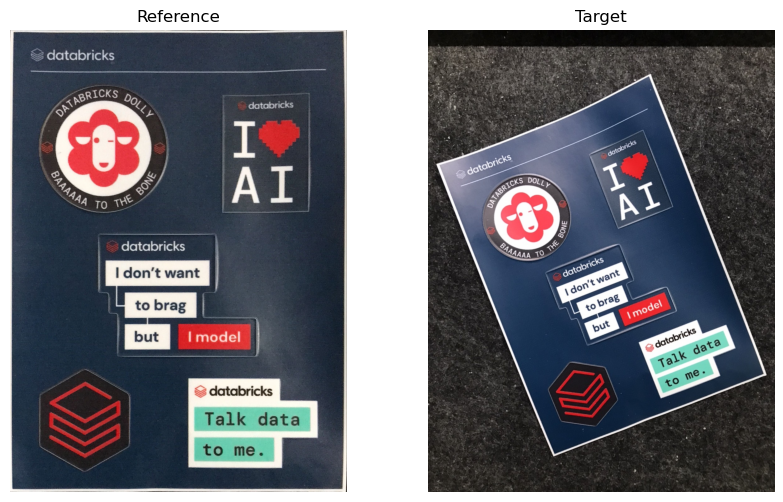

In [18]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# 1️⃣ Load Images
# -----------------------------
ref_image_path = 'Homography/refDatabricks.jpg'
target_image_path = 'Homography/databricks.jpg'

ref_img = cv.imread(ref_image_path)
target_img = cv.imread(target_image_path)

# Check images
assert ref_img is not None, f"Image at {ref_image_path} not found"
assert target_img is not None, f"Image at {target_image_path} not found"

# Convert BGR to RGB for Matplotlib display
ref_img_rgb = cv.cvtColor(ref_img, cv.COLOR_BGR2RGB)
target_img_rgb = cv.cvtColor(target_img, cv.COLOR_BGR2RGB)

# Display original images
plt.figure(figsize=[10,6])
plt.subplot(121); plt.imshow(ref_img_rgb); plt.axis('off'); plt.title("Reference")
plt.subplot(122); plt.imshow(target_img_rgb); plt.axis('off'); plt.title("Target")
plt.show()


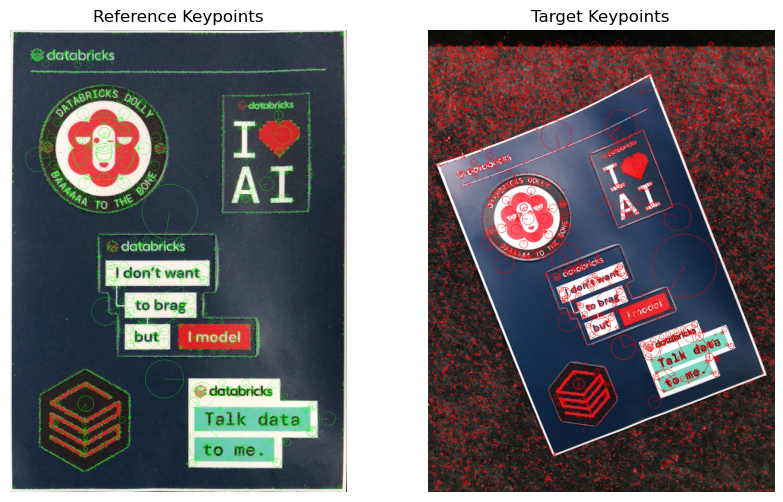

In [19]:
# -----------------------------
# 2️⃣ Convert to Grayscale
# -----------------------------
ref_gray = cv.cvtColor(ref_img, cv.COLOR_BGR2GRAY)
target_gray = cv.cvtColor(target_img, cv.COLOR_BGR2GRAY)

# -----------------------------
# 3️⃣ Initialize SIFT and Detect Keypoints
# -----------------------------
sift = cv.SIFT_create()
kp_ref, des_ref = sift.detectAndCompute(ref_gray, None)
kp_target, des_target = sift.detectAndCompute(target_gray, None)

# -----------------------------
# 4️⃣ Visualize Keypoints
# -----------------------------
ref_kp_img = cv.drawKeypoints(ref_img_rgb, kp_ref, outImage=np.array([]), color=(0,255,0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
target_kp_img = cv.drawKeypoints(target_img_rgb, kp_target, outImage=np.array([]), color=(255,0,0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=[10,6])
plt.subplot(121); plt.imshow(ref_kp_img); plt.axis('off'); plt.title("Reference Keypoints")
plt.subplot(122); plt.imshow(target_kp_img); plt.axis('off'); plt.title("Target Keypoints")
plt.show()


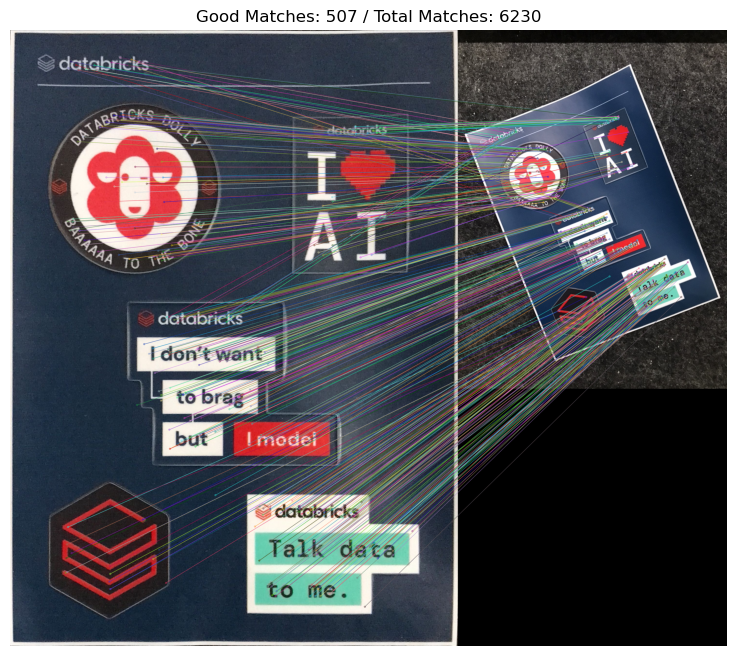

Keypoint in Reference Image:
  x, y: (228.32388305664062, 2236.783447265625)
  size: 16.62125015258789
  angle: 110.45856475830078
Descriptor vector (128-d): [ 21.   0.   0.  39. 141.   0.   0.   7. 141.   0.   0.   4.  32.   1.
   0.  72.  75.   0.   0.  33. 141.   1.   0.  27.   1.   0.   0.  11.
  92.   6.   2.   1.  28.   1.   0.  40. 141.   0.   0.   5. 141.  23.
   5.  15.  28.   0.   0.  42.  60.   7.   5. 112. 141.   0.   0.   9.
   3.   2.   1.  27.  75.   1.   0.   1.  12.   6.   1.  53. 141.   0.
   0.   1.  95. 111.  60.  27.  11.   0.   0.   1.  10.  23.  65. 141.
  66.   0.   0.   0.   3.   0.   1.  15.  25.   4.   1.   8.   0.   1.
   7.  65.  30.   0.   1.   1.   0.  11.  17.   4.   3.   1.  12.   7.
   0.   2.  16.  16.   1.   1.  36.  15.   1.   0.   1.   2.   0.   0.
  36.  44.]

Keypoint in Target Image:
  x, y: (441.1144104003906, 1224.57763671875)
  size: 6.841651439666748
  angle: 91.84828186035156
Descriptor vector (128-d): [ 32.   0.   0.  30. 150.   0.   0.   

In [20]:
# -----------------------------
# 5️⃣ Feature Matching (BFMatcher + Lowe's Ratio Test)
# -----------------------------
bf = cv.BFMatcher()
matches = bf.knnMatch(des_ref, des_target, k=2)

# Apply Lowe's ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.5 * n.distance:
        good_matches.append([m])

# -----------------------------
# 6️⃣ Draw Matches
# -----------------------------
matches_img = cv.drawMatchesKnn(ref_img_rgb, kp_ref, target_img_rgb, kp_target, good_matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=[15,8])
plt.imshow(matches_img)
plt.axis('off')
plt.title(f"Good Matches: {len(good_matches)} / Total Matches: {len(matches)}")
plt.show()

# -----------------------------
# 7️⃣ Inspect First Good Match Descriptors
# -----------------------------
idx = 0  # first good match
m = good_matches[idx][0]

print("Keypoint in Reference Image:")
print("  x, y:", kp_ref[m.queryIdx].pt)
print("  size:", kp_ref[m.queryIdx].size)
print("  angle:", kp_ref[m.queryIdx].angle)
print("Descriptor vector (128-d):", des_ref[m.queryIdx])

print("\nKeypoint in Target Image:")
print("  x, y:", kp_target[m.trainIdx].pt)
print("  size:", kp_target[m.trainIdx].size)
print("  angle:", kp_target[m.trainIdx].angle)
print("Descriptor vector (128-d):", des_target[m.trainIdx])


In [21]:
## Shift and Image Alignment

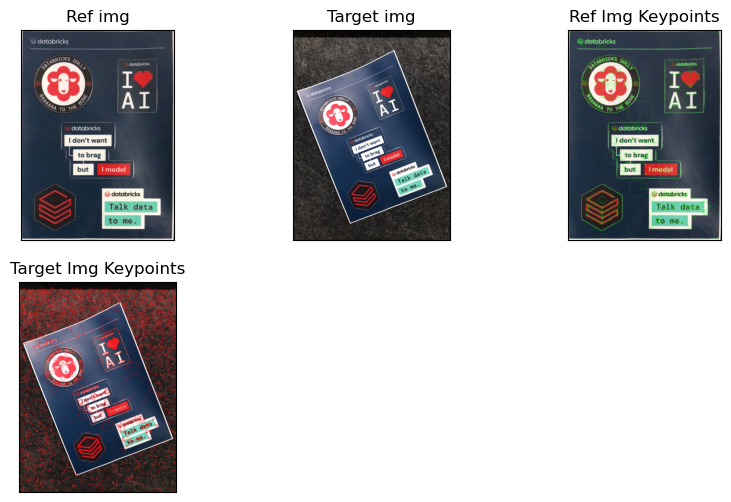

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# 1️⃣ Load Images
# -----------------------------
ref_image_path = 'Homography/refDatabricks.jpg'
target_image_path = 'Homography/databricks.jpg'

ref_img = cv.imread(ref_image_path)
target_img = cv.imread(target_image_path)

# Check images
assert ref_img is not None, f"Image at {ref_image_path} not found"
assert target_img is not None, f"Image at {target_image_path} not found"

# Convert BGR to RGB for Matplotlib display
ref_img_rgb = cv.cvtColor(ref_img, cv.COLOR_BGR2RGB)
target_img_rgb = cv.cvtColor(target_img, cv.COLOR_BGR2RGB)

sift = cv.SIFT_create()
kp_ref, des_ref = sift.detectAndCompute(ref_gray, None)
kp_target, des_target = sift.detectAndCompute(target_gray, None)

# -----------------------------
# 4️⃣ Visualize Keypoints
# -----------------------------
ref_kp_img = cv.drawKeypoints(ref_img_rgb, kp_ref, outImage=np.array([]), color=(0,255,0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
target_kp_img = cv.drawKeypoints(target_img_rgb, kp_target, outImage=np.array([]), color=(255,0,0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

titles = ['Ref img','Target img','Ref Img Keypoints','Target Img Keypoints' ]
images = [ref_img_rgb,target_img_rgb,ref_kp_img,target_kp_img]

plt.figure(figsize=[10,6])

for i in range(len(titles)):
    plt.subplot(2,3,i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])

plt.show()


In [26]:
print(des_ref.shape)

(6230, 128)


In [28]:
print(des_target.shape)

(15292, 128)


In [30]:
print(len(kp_ref))

6230


In [33]:
print(des_ref[0])

[  8.   0.   0.   0.   0.   0.   0.   0. 183.   4.   0.   0.   0.   0.
   0.  11. 183.   4.   0.   1.   3.   0.   0.   9.   2.   1.   0.   3.
  16.   5.   0.   1.  13.   0.   0.   0.   0.   0.   0.   1. 183.   4.
   0.   0.   0.   0.   0.  34. 183.   8.   4.   1.   1.   1.   0.  22.
   1.   1.   4.   2.   8.   7.   0.   1.  16.   0.   0.   0.   0.   0.
   0.   0. 183.  36.   0.   0.   0.   0.   0.   7. 171.  54.   4.   0.
   0.   0.   0.   4.   4.   4.   3.   1.   2.   1.   1.   1.  12.   0.
   0.   0.   0.   0.   0.   2. 183.   5.   0.   0.   0.   0.   0.  41.
 145.   8.   0.   0.   0.   0.   0.  36.   5.   1.   0.   1.   0.   1.
   1.   4.]


In [34]:
# Shapes of descriptors
print("Descriptor shape (Reference):", des_ref.shape)
print("Descriptor shape (Target):   ", des_target.shape)

# Number of keypoints
print("Number of keypoints (Reference):", len(kp_ref))
print("Number of keypoints (Target):   ", len(kp_target))

# First descriptor vectors (128-d)
print("\nFirst descriptor (Reference):\n", des_ref[0])
print("\nFirst descriptor (Target):\n", des_target[0])

Descriptor shape (Reference): (6230, 128)
Descriptor shape (Target):    (15292, 128)
Number of keypoints (Reference): 6230
Number of keypoints (Target):    15292

First descriptor (Reference):
 [  8.   0.   0.   0.   0.   0.   0.   0. 183.   4.   0.   0.   0.   0.
   0.  11. 183.   4.   0.   1.   3.   0.   0.   9.   2.   1.   0.   3.
  16.   5.   0.   1.  13.   0.   0.   0.   0.   0.   0.   1. 183.   4.
   0.   0.   0.   0.   0.  34. 183.   8.   4.   1.   1.   1.   0.  22.
   1.   1.   4.   2.   8.   7.   0.   1.  16.   0.   0.   0.   0.   0.
   0.   0. 183.  36.   0.   0.   0.   0.   0.   7. 171.  54.   4.   0.
   0.   0.   0.   4.   4.   4.   3.   1.   2.   1.   1.   1.  12.   0.
   0.   0.   0.   0.   0.   2. 183.   5.   0.   0.   0.   0.   0.  41.
 145.   8.   0.   0.   0.   0.   0.  36.   5.   1.   0.   1.   0.   1.
   1.   4.]

First descriptor (Target):
 [  5.  12.   3.   3.   5.   8.   3.   3.   0.   0.   2.   3.   4.   9.
   1.   0.   3.   1.   1.   1.   0.   0.   0.   0.   0.

In [50]:
def get_similarity_from_desc(desc1, desc2):
    bf = cv.BFMatcher()
    matches = bf.knnMatch(desc1, desc2, k=2)

    # Apply ratio test
    good = []
    for m, n in matches:
        if m.distance < 0.10 * n.distance:
            good.append([m])
    
    similarity_percentage = (len(good) / len(matches)) * 100

    return len(good),similarity_percentage



In [51]:
good_count,similarity_pct = get_similarity_from_desc(des_ref,des_target)
print(f"Good matches: {good_count}")
print(f"Similarity: {similarity_pct:.2f}%")

Good matches: 3
Similarity: 0.05%


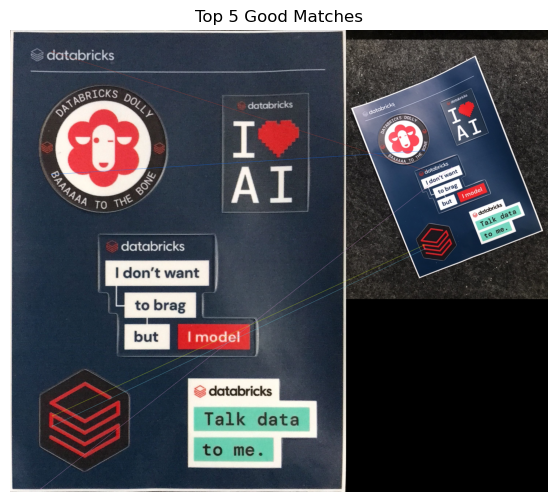

[[< cv2.DMatch 0x12e795bf0>], [< cv2.DMatch 0x12e79e110>], [< cv2.DMatch 0x12e79e370>], [< cv2.DMatch 0x12e79e3f0>], [< cv2.DMatch 0x12e79e6d0>], [< cv2.DMatch 0x12e79eb90>], [< cv2.DMatch 0x12e79ebf0>], [< cv2.DMatch 0x12e79ef30>], [< cv2.DMatch 0x12e79fb10>], [< cv2.DMatch 0x12e7a40f0>], [< cv2.DMatch 0x12e7a4170>], [< cv2.DMatch 0x12e7a41b0>], [< cv2.DMatch 0x12e7a4990>], [< cv2.DMatch 0x12e7a49d0>], [< cv2.DMatch 0x12e7a4b70>], [< cv2.DMatch 0x12e7a4bb0>], [< cv2.DMatch 0x12e7a5390>], [< cv2.DMatch 0x12e7a5b30>], [< cv2.DMatch 0x12e7a6a10>], [< cv2.DMatch 0x12e7a73f0>], [< cv2.DMatch 0x12e7a7590>], [< cv2.DMatch 0x12e7ac870>], [< cv2.DMatch 0x12e7adf10>], [< cv2.DMatch 0x12e7ae830>], [< cv2.DMatch 0x12e7ae870>], [< cv2.DMatch 0x12e7aeab0>], [< cv2.DMatch 0x12e7aecb0>], [< cv2.DMatch 0x12e7af490>], [< cv2.DMatch 0x12e7b4370>], [< cv2.DMatch 0x12e7b47b0>], [< cv2.DMatch 0x12e7b65f0>], [< cv2.DMatch 0x12e7b68f0>], [< cv2.DMatch 0x12e7b7890>], [< cv2.DMatch 0x12e7bc550>], [< cv2.DMatch

In [53]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

#  Load Images
ref_image_path = 'Homography/refDatabricks.jpg'
target_image_path = 'Homography/databricks.jpg'

ref_img = cv.imread(ref_image_path)
target_img = cv.imread(target_image_path)

# Convert BGR to RGB for Matplotlib display
ref_img_rgb = cv.cvtColor(ref_img, cv.COLOR_BGR2RGB)
target_img_rgb = cv.cvtColor(target_img, cv.COLOR_BGR2RGB)

#  Convert to Grayscale
ref_gray = cv.cvtColor(ref_img, cv.COLOR_BGR2GRAY)
target_gray = cv.cvtColor(target_img, cv.COLOR_BGR2GRAY) 

# Initialize SIFT and Detect Keypoints
sift = cv.SIFT_create(nfeatures = 0, nOctaveLayers=5, contrastThreshold=0.04, edgeThreshold = 10, sigma = 1.6)
kp_ref, des_ref = sift.detectAndCompute(ref_gray, None)
kp_target, des_target = sift.detectAndCompute(target_gray, None)

bf = cv.BFMatcher()
matches = bf.knnMatch(des_ref, des_target, k=2)

# Apply Lowe's ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.5 * n.distance:
        good_matches.append([m])

# -----------------------------
# 6️ Draw Top 5 Matches
# -----------------------------
top_matches = good_matches[:5]  # Take only the first 5 matches
matches_img = cv.drawMatchesKnn(
    ref_img_rgb, kp_ref,
    target_img_rgb, kp_target,
    top_matches, None,
    flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

plt.figure(figsize=[12,6])
plt.imshow(matches_img)
plt.axis('off')
plt.title(f"Top 5 Good Matches")
plt.show()
print(good_matches)


In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# 1️⃣ Load Images
# -----------------------------
ref_image_path = 'Homography/refDatabricks.jpg'
target_image_path = 'Homography/databricks.jpg'

ref_img = cv.imread(ref_image_path)
target_img = cv.imread(target_image_path)

# Convert BGR to RGB for display
ref_img_rgb = cv.cvtColor(ref_img, cv.COLOR_BGR2RGB)
target_img_rgb = cv.cvtColor(target_img, cv.COLOR_BGR2RGB)

# -----------------------------
# 2️⃣ Convert to Grayscale
# -----------------------------
ref_gray = cv.cvtColor(ref_img, cv.COLOR_BGR2GRAY)
target_gray = cv.cvtColor(target_img, cv.COLOR_BGR2GRAY)

# -----------------------------
# 3️⃣ SIFT Feature Detection
# -----------------------------
sift = cv.SIFT_create(nOctaveLayers=20)  # increase scale-space layers
kp_ref, des_ref = sift.detectAndCompute(ref_gray, None)
kp_target, des_target = sift.detectAndCompute(target_gray, None)

# -----------------------------
# 4️⃣ Compute Good Matches and Similarity
# -----------------------------
bf = cv.BFMatcher()
matches = bf.knnMatch(des_ref, des_target, k=2)

good_matches = []
ratio = 0.75  # Lowe's ratio
for m, n in matches:
    if m.distance < ratio * n.distance:
        good_matches.append([m])

good_count = len(good_matches)
similarity_pct = (good_count / len(matches)) * 100

print(f"Good matches: {good_count}")
print(f"Total Matches: {len(matches)}")
print(f"Similarity: {similarity_pct:.2f}%")

# -----------------------------
# 5️⃣ Draw Top 100 Good Matches
# -----------------------------
top_matches = good_matches[:100]
matches_img = cv.drawMatchesKnn(
    ref_img_rgb, kp_ref,
    target_img_rgb, kp_target,
    top_matches, None,
    flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

plt.figure(figsize=[12,6])
plt.imshow(matches_img)
plt.axis('off')
plt.title(f"Top 5 Good Matches")
plt.show()


Good matches: 1257
Total Matches: 12162
Similarity: 10.34%


Number of good matches: 990
Similarity: 6.47%


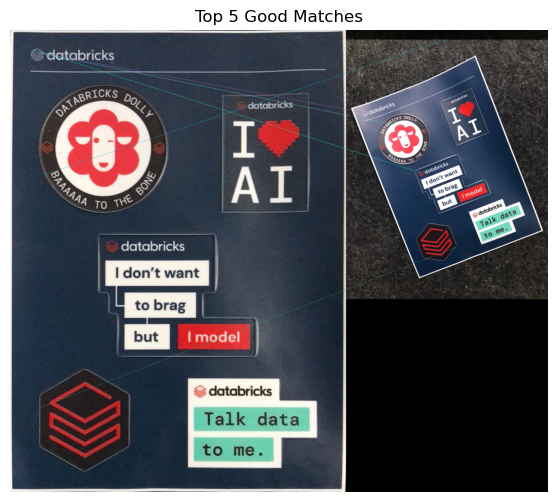

In [68]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np

class SIFTMatcher:
    def __init__(self, ref_image_path, target_image_path, ratio=0.75):
        self.ref_image_path = ref_image_path
        self.target_image_path = target_image_path
        self.ratio = ratio  # Lowe's ratio for good matches

        # Load images
        self.ref_img = cv.imread(ref_image_path)
        self.target_img = cv.imread(target_image_path)
        if self.ref_img is None or self.target_img is None:
            raise FileNotFoundError("One or both image paths are invalid.")
        
        # Convert to grayscale
        self.ref_gray = cv.cvtColor(self.ref_img, cv.COLOR_BGR2GRAY)
        self.target_gray = cv.cvtColor(self.target_img, cv.COLOR_BGR2GRAY)

        # Convert to RGB for visualization
        self.ref_rgb = cv.cvtColor(self.ref_img, cv.COLOR_BGR2RGB)
        self.target_rgb = cv.cvtColor(self.target_img, cv2.COLOR_BGR2RGB)

        # Initialize SIFT
        self.sift = cv.SIFT_create()
        self.kp_ref, self.des_ref = None, None
        self.kp_target, self.des_target = None, None
        self.good_matches = None

    # Step 1: Detect keypoints and compute descriptors
    def detect_and_compute(self):
        self.kp_ref, self.des_ref = self.sift.detectAndCompute(self.ref_gray, None)
        self.kp_target, self.des_target = self.sift.detectAndCompute(self.target_gray, None)

    # Step 2: Match descriptors and compute good matches
    def match_features(self):
        bf = cv.BFMatcher()
        matches = bf.knnMatch(self.des_ref, self.des_target, k=2)
        self.good_matches = [m for m, n in matches if m.distance < self.ratio * n.distance]

    # Step 3: Compute similarity percentage
    def similarity_percentage(self):
        if self.good_matches is None:
            raise ValueError("No matches computed. Call match_features() first.")
        return (len(self.good_matches) / max(len(self.kp_ref), len(self.kp_target))) * 100

    # Step 4: Draw top N good matches
    def draw_matches(self, top_n=20):
        if self.good_matches is None:
            raise ValueError("No matches computed. Call match_features() first.")
        top_matches = self.good_matches[:top_n]
        matches_img = cv.drawMatches(
            self.ref_rgb, self.kp_ref,
            self.target_rgb, self.kp_target,
            top_matches, None,
            flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )
        plt.figure(figsize=(12, 6))
        plt.imshow(matches_img)
        plt.axis('off')
        plt.title(f"Top {top_n} Good Matches")
        plt.show()


# -----------------------------
# Example Usage
# -----------------------------
if __name__ == '__main__':
    ref_image = 'Homography/refDatabricks.jpg'
    target_image = 'Homography/databricks.jpg'

    sift_matcher = SIFTMatcher(ref_image, target_image, ratio=0.75)
    sift_matcher.detect_and_compute()
    sift_matcher.match_features()

    print(f"Number of good matches: {len(sift_matcher.good_matches)}")
    print(f"Similarity: {sift_matcher.similarity_percentage():.2f}%")

    sift_matcher.draw_matches(top_n=5)


[ WARN:0@10274.326] global loadsave.cpp:275 findDecoder imread_('assets/3d_drawings.jpg'): can't open/read file: check file path/integrity


FileNotFoundError: Could not read image from 'assets/3d_drawings.jpg'

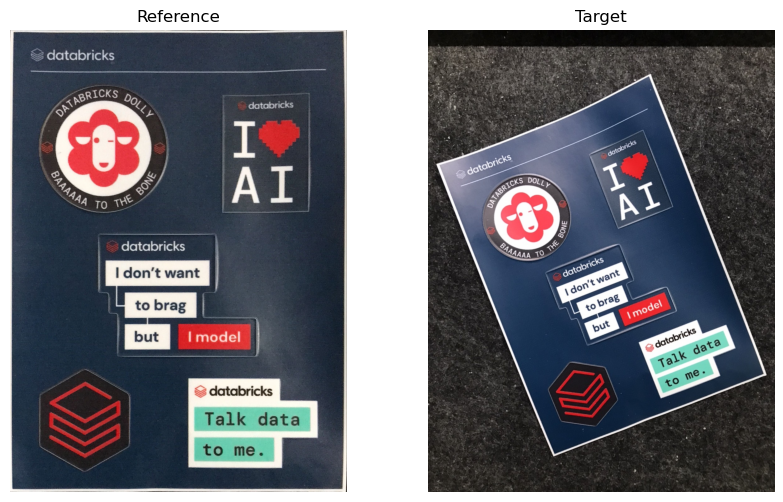

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# 1️ Load Images
# -----------------------------
ref_image_path = 'Homography/refDatabricks.jpg'
target_image_path = 'Homography/databricks.jpg'

ref_img = cv.imread(ref_image_path)
target_img = cv.imread(target_image_path)

# Check images
assert ref_img is not None, f"Image at {ref_image_path} not found"
assert target_img is not None, f"Image at {target_image_path} not found"

# Convert BGR to RGB for Matplotlib display
ref_img_rgb = cv.cvtColor(ref_img, cv.COLOR_BGR2RGB)
target_img_rgb = cv.cvtColor(target_img, cv.COLOR_BGR2RGB)

# Display original images
plt.figure(figsize=[10,6])
plt.subplot(121); plt.imshow(ref_img_rgb); plt.axis('off'); plt.title("Reference")
plt.subplot(122); plt.imshow(target_img_rgb); plt.axis('off'); plt.title("Target")
plt.show()


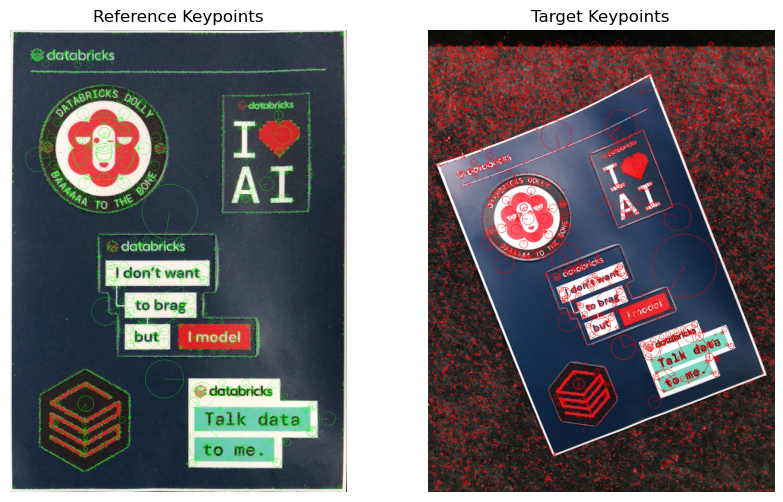

In [2]:
# -----------------------------
# 2️ Convert to Grayscale
# -----------------------------
ref_gray = cv.cvtColor(ref_img, cv.COLOR_BGR2GRAY)
target_gray = cv.cvtColor(target_img, cv.COLOR_BGR2GRAY) 

# -----------------------------
# 3️Initialize SIFT and Detect Keypoints
# -----------------------------
sift = cv.SIFT_create()
kp_ref, des_ref = sift.detectAndCompute(ref_gray, None)
kp_target, des_target = sift.detectAndCompute(target_gray, None)

# -----------------------------
# 4️ Visualize Keypoints
# -----------------------------
ref_kp_img = cv.drawKeypoints(ref_img_rgb, kp_ref, outImage=np.array([]), color=(0,255,0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
target_kp_img = cv.drawKeypoints(target_img_rgb, kp_target, outImage=np.array([]), color=(255,0,0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=[10,6])
plt.subplot(121); plt.imshow(ref_kp_img); plt.axis('off'); plt.title("Reference Keypoints")
plt.subplot(122); plt.imshow(target_kp_img); plt.axis('off'); plt.title("Target Keypoints")
plt.show()


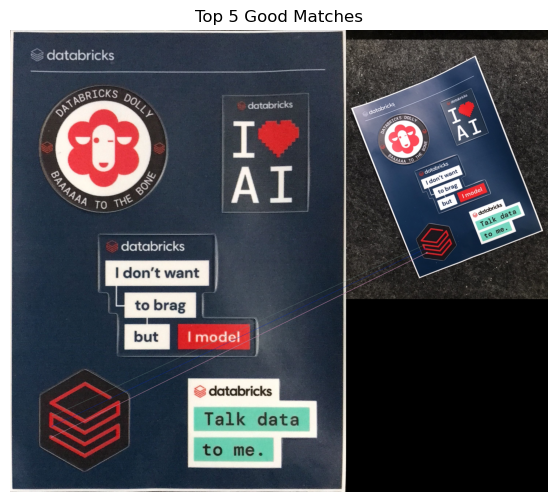

In [ ]:
# -----------------------------
# 5️ Feature Matching (BFMatcher + Lowe's Ratio Test)
# -----------------------------
bf = cv.BFMatcher()
matches = bf.knnMatch(des_ref, des_target, k=2)

# Apply Lowe's ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.5 * n.distance:
        good_matches.append([m])

# -----------------------------
# 6️ Draw Top 5 Matches
# -----------------------------
top_matches = good_matches[:5]  # Take only the first 5 matches
matches_img = cv.drawMatchesKnn(
    ref_img_rgb, kp_ref,
    target_img_rgb, kp_target,
    top_matches, None,
    flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

plt.figure(figsize=[12,6])
plt.imshow(matches_img)
plt.axis('off')
plt.title(f"Top 5 Good Matches")
plt.show()





In [33]:
# Extract location of good matches



points1 = np.zeros((len(good_matches), 2), dtype=np.float32)
points2 = np.zeros((len(good_matches), 2), dtype=np.float32)

for i, match in enumerate(good_matches):
  points1[i, :] = kp_ref[match[0].queryIdx].pt
  points2[i, :] = kp_target[match[0].trainIdx].pt


# Find homography
homography_matrix, mask = cv.findHomography(points2, points1, cv.RANSAC)

idx = 10
print("Homography")
print(homography_matrix)

print("Point-1 (Reference)")
print(points1[idx, :])
print("")
print("Point-2 (scan)")
print(points2[idx, :])
print("")

print("Express point-2 (scan) in homogeneous coordinates")
p2_homo = np.append(points2[idx, :],1)
print(p2_homo)
print("")

p1_homo = np.matmul(homography_matrix,p2_homo.T)
print("p1_homo = H * p2_homo")
print(p1_homo)
print("")
print("Normalized p1_homo (Reference)")
print (p1_homo/p1_homo[2])

Homography
[[ 2.39088076e+00 -9.35560384e-01  3.22733931e+02]
 [ 9.58873779e-01  2.37815251e+00 -1.07106851e+03]
 [ 2.10523700e-05  3.92057158e-06  1.00000000e+00]]
Point-1 (Reference)
[247.06807 825.39136]

Point-2 (scan)
[208.88788 555.3483 ]

Express point-2 (scan) in homogeneous coordinates
[208.88787842 555.34832764   1.        ]

p1_homo = H * p2_homo
[302.59804604 449.93161766   1.00657487]

Normalized p1_homo (Reference)
[300.62149944 446.99269976   1.        ]


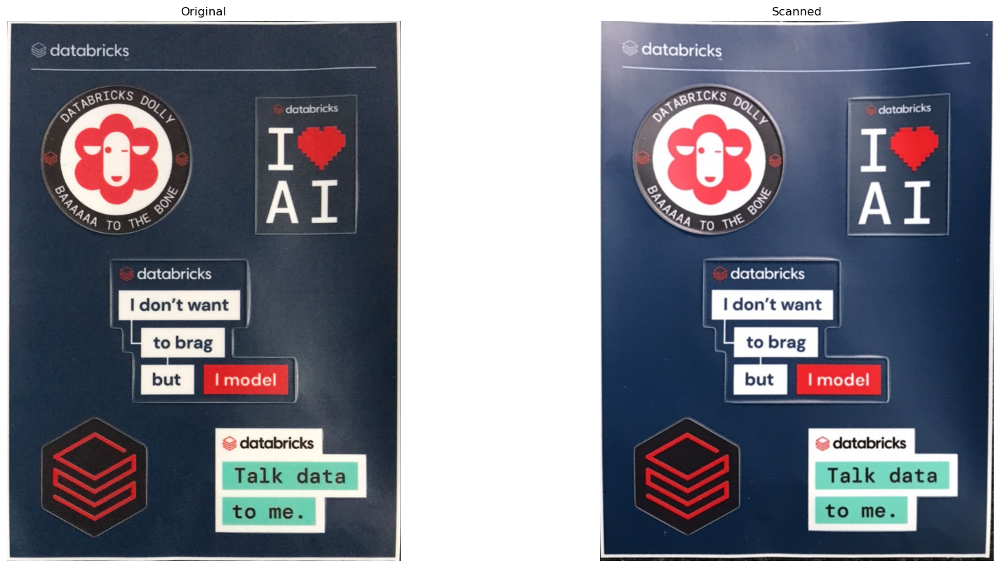

In [40]:
# Use homography to warp image
height, width, channels = ref_img.shape
im2_warped = cv.warpPerspective(target_img_rgb, homography_matrix, (width, height))

# Display results
plt.figure(figsize=[20,10]);
plt.subplot(121); plt.imshow(ref_img_rgb); plt.axis('off'); plt.title("Original");
plt.subplot(122); plt.imshow(im2_warped); plt.axis('off'); plt.title("Scanned");